##### About the dataset

This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.

#### Importing Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split,GridSearchCV,cross_val_score
from sklearn.preprocessing import LabelEncoder
import statsmodels.api as sm
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split,GridSearchCV,cross_val_score
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
import pickle
import warnings
warnings.filterwarnings('ignore')

#### Loading datasets

In [2]:
df = pd.read_csv("temperature.csv")
df.head(5)

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


#### The problem is regression problem
#### In the dataset we have two target variables Next_Tmax and Next_Tmin,so splitting the dataset 


#### First Doing the analysis on Next_Tmax

In [48]:
df1 = df.drop('Next_Tmin',axis=1)
df1.head(3)

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1


#### Converting Date to datetime format

In [49]:
df1['Date']=pd.to_datetime(df1['Date'])

#### Extracting day, montha and year

In [50]:
df1['Day'] = df1['Date'].dt.day
df1['Month'] = df1['Date'].dt.month
df1['Year'] = df1['Date'].dt.year
df1 = df1.drop('Date',axis=1)
df1.head(3)

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Day,Month,Year
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,...,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,30.0,6.0,2013.0
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,...,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,30.0,6.0,2013.0
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,...,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,30.0,6.0,2013.0


#### Checking for null values

In [51]:
pd.set_option('display.max_rows',None)
df1.isnull().sum()

station              2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Day                  2
Month                2
Year                 2
dtype: int64

#### Null values exists in the dataset

In [52]:
df1.shape

(7752, 26)

In [53]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 26 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Present_Tmax      7682 non-null   float64
 2   Present_Tmin      7682 non-null   float64
 3   LDAPS_RHmin       7677 non-null   float64
 4   LDAPS_RHmax       7677 non-null   float64
 5   LDAPS_Tmax_lapse  7677 non-null   float64
 6   LDAPS_Tmin_lapse  7677 non-null   float64
 7   LDAPS_WS          7677 non-null   float64
 8   LDAPS_LH          7677 non-null   float64
 9   LDAPS_CC1         7677 non-null   float64
 10  LDAPS_CC2         7677 non-null   float64
 11  LDAPS_CC3         7677 non-null   float64
 12  LDAPS_CC4         7677 non-null   float64
 13  LDAPS_PPT1        7677 non-null   float64
 14  LDAPS_PPT2        7677 non-null   float64
 15  LDAPS_PPT3        7677 non-null   float64
 16  LDAPS_PPT4        7677 non-null   float64


#### Replacing the null values with mean

In [54]:
df1["station"] = df1['station'].fillna(df1['station'].mean())
df1["Present_Tmax"] = df1['Present_Tmax'].fillna(df1['Present_Tmax'].mean())
df1["Present_Tmin"] = df1['Present_Tmin'].fillna(df1['Present_Tmin'].mean())
df1["LDAPS_RHmin"] = df1['LDAPS_RHmin'].fillna(df1['LDAPS_RHmin'].mean())
df1["LDAPS_RHmax"] = df1['LDAPS_RHmax'].fillna(df1['LDAPS_RHmax'].mean())
df1["LDAPS_Tmax_lapse"] = df1['LDAPS_Tmax_lapse'].fillna(df1['LDAPS_Tmax_lapse'].mean())
df1["LDAPS_Tmin_lapse"] = df1['LDAPS_Tmin_lapse'].fillna(df1['LDAPS_Tmin_lapse'].mean())
df1["LDAPS_WS"] = df1['LDAPS_WS'].fillna(df1['LDAPS_WS'].mean())
df1["LDAPS_LH"] = df1['LDAPS_LH'].fillna(df1['LDAPS_LH'].mean())
df1["LDAPS_CC1"] = df1['LDAPS_CC1'].fillna(df1['LDAPS_CC1'].mean())
df1["LDAPS_CC2"] = df1['LDAPS_CC2'].fillna(df1['LDAPS_CC2'].mean())
df1["LDAPS_CC3"] = df1['LDAPS_CC3'].fillna(df1['LDAPS_CC3'].mean())
df1["LDAPS_CC4"] = df1['LDAPS_CC4'].fillna(df1['LDAPS_CC4'].mean())
df1["LDAPS_PPT1"] = df1['LDAPS_PPT1'].fillna(df1['LDAPS_PPT1'].mean())
df1["LDAPS_PPT2"] = df1['LDAPS_PPT2'].fillna(df1['LDAPS_PPT2'].mean())
df1["LDAPS_PPT3"] = df1['LDAPS_PPT3'].fillna(df1['LDAPS_PPT3'].mean())
df1["LDAPS_PPT4"] = df1['LDAPS_PPT4'].fillna(df1['LDAPS_PPT4'].mean())
df1["Next_Tmax"] = df1['Next_Tmax'].fillna(df1['Next_Tmax'].mean())
df1["Day"] = df1['Day'].fillna(df1['Day'].mean())
df1["Month"] = df1['Month'].fillna(df1['Month'].mean())
df1["Year"] = df1['Year'].fillna(df1['Year'].mean())

#### EDA

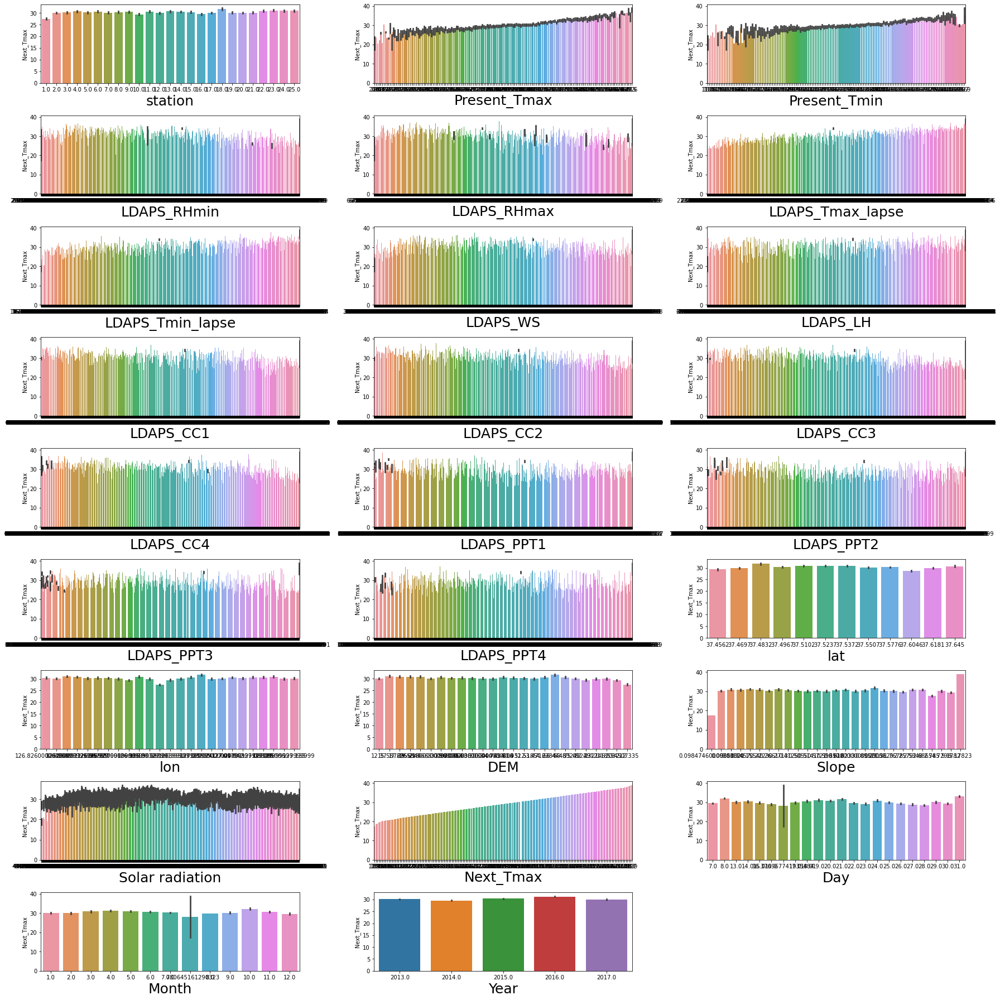

In [14]:
plt.figure(figsize=(25,25),facecolor="white")
plotnumber=1
for column in df1:
    if plotnumber<=26:
        ax=plt.subplot(13,2,plotnumber)
        sns.barplot(x=df1[column],y=df['Next_Tmax'],data=df1)
        plt.xlabel(column,fontsize=25)
    plotnumber+=1
plt.tight_layout()

#### Finding the correlation for better understanding

In [30]:
df1.corr()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Day,Month,Year
station,1.000000e+00,0.112655,0.131646,-0.066733,-0.166984,0.069107,0.104758,0.005277,-0.133357,0.006919,...,-0.010401,-2.375015e-01,-1.187044e-01,-2.558297e-01,-9.006090e-02,-0.019001,0.107983,-7.467287e-18,9.188159e-18,0.000000e+00
Present_Tmax,1.126554e-01,1.000000,0.618760,-0.204571,-0.301787,0.570129,0.623496,-0.121820,0.135463,-0.311805,...,-0.099607,-5.261489e-02,9.019776e-03,-1.871206e-01,-1.058092e-01,-0.025439,0.610348,-1.438070e-01,-1.150750e-03,5.980007e-02
Present_Tmin,1.316462e-01,0.618760,1.000000,0.123143,-0.015140,0.464151,0.762993,-0.034675,-0.009258,0.084447,...,-0.062965,-7.847529e-02,-4.346122e-02,-2.502747e-01,-1.463390e-01,0.053578,0.471806,-1.082721e-01,-3.434226e-03,3.739568e-02
LDAPS_RHmin,-6.673316e-02,-0.204571,0.123143,1.000000,0.579141,-0.564580,0.089476,0.294361,-0.070858,0.613818,...,0.168595,8.709887e-02,-7.623712e-02,1.021149e-01,1.237439e-01,0.244080,-0.437898,-6.583711e-02,-5.394021e-02,-2.044507e-03
LDAPS_RHmax,-1.669845e-01,-0.301787,-0.015140,0.579141,1.000000,-0.373404,-0.114143,0.135333,0.238579,0.436652,...,0.117853,1.957977e-01,2.566694e-02,1.771681e-01,2.195989e-01,0.149261,-0.283738,-1.300684e-02,-3.998985e-02,-1.418320e-01
LDAPS_Tmax_lapse,6.910718e-02,0.570129,0.464151,-0.564580,-0.373404,1.000000,0.654021,-0.311996,0.048010,-0.438439,...,-0.160273,-4.209291e-02,9.066575e-02,-1.788954e-01,-1.623324e-01,0.047971,0.827189,-1.603214e-01,-2.168992e-02,1.617217e-02
LDAPS_Tmin_lapse,1.047582e-01,0.623496,0.762993,0.089476,-0.114143,0.654021,1.000000,-0.130035,-0.134761,0.010901,...,-0.094655,-9.625683e-02,-2.670103e-02,-1.954553e-01,-1.858487e-01,0.159975,0.586983,-1.779545e-01,-2.749581e-02,-4.693413e-03
LDAPS_WS,5.277000e-03,-0.121820,-0.034675,0.294361,0.135333,-0.311996,-0.130035,1.000000,0.006711,0.289445,...,0.144085,3.665702e-02,-5.946615e-02,1.910530e-01,1.716286e-01,0.121759,-0.342729,-2.913467e-02,-8.128770e-02,-1.113577e-01
LDAPS_LH,-1.333566e-01,0.135463,-0.009258,-0.070858,0.238579,0.048010,-0.134761,0.006711,1.000000,-0.147296,...,0.019979,1.332208e-01,2.582205e-02,5.513344e-02,8.678088e-02,-0.047384,0.157616,-1.209485e-02,-2.274775e-02,5.707733e-02
LDAPS_CC1,6.918787e-03,-0.311805,0.084447,0.613818,0.436652,-0.438439,0.010901,0.289445,-0.147296,1.000000,...,0.091722,-8.130615e-03,-6.842827e-03,-1.409033e-02,-2.075199e-02,0.218309,-0.452541,-2.013716e-02,-7.627189e-02,-6.647797e-02


#### Plotting the correlation graph

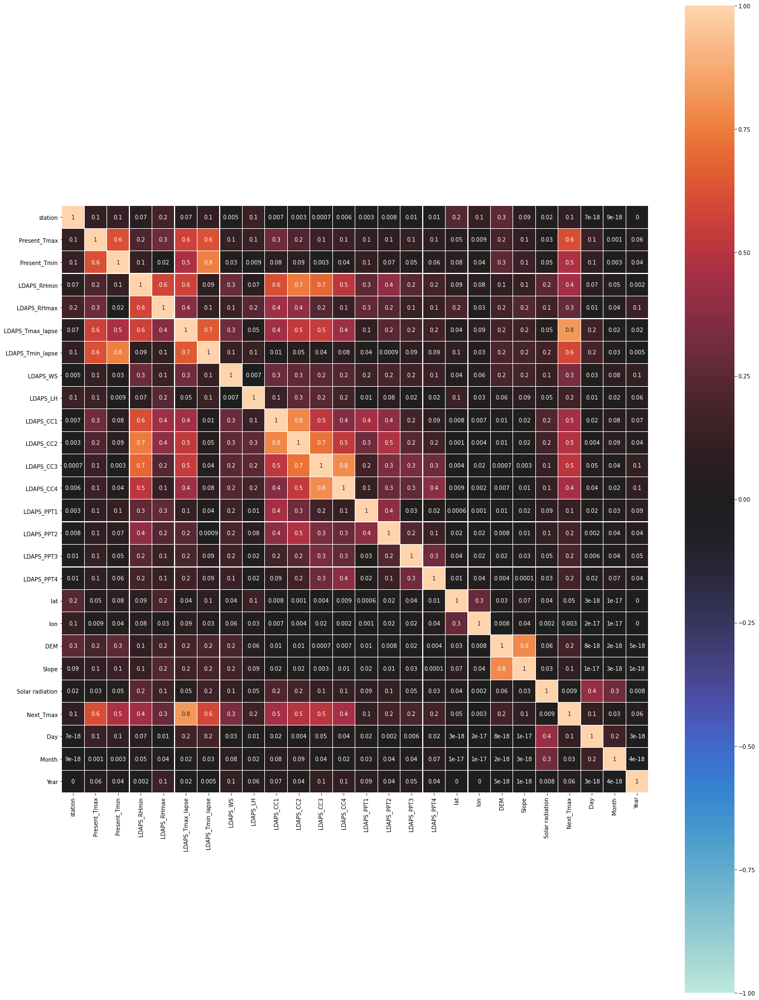

In [31]:
df1_corr = df1.corr().abs()
plt.figure(figsize=(20,25))
sns.heatmap(df1_corr,vmin=-1,vmax=1,annot=True,square = True,center=0,fmt='.1g',linewidth=.2)
plt.tight_layout()

#### From the heatmap its clear that Multicoliinearity exists in the dataset
#### LDAPS_Tmax_lapse is having high correlation with Next_Tmax followed by LDAPS_Tmin_lapse, Present_Tmax

#### Statistical Analysis of the dataset

In [32]:
df1.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Day,Month,Year
count,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,...,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000
mean,13.000000,29.768211,23.225059,56.759372,88.374804,29.613447,23.512589,7.097875,62.505019,0.368774,...,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,16.370968,7.080645,2015.000000
std,7.210637,2.956557,2.403036,14.596973,7.157124,2.932898,2.333973,2.173245,33.567001,0.261185,...,1.200364,0.050352,0.079435,54.279780,1.370444,429.158867,3.122557,8.240268,2.238075,1.414122
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,7.000000,1.000000,2013.000000
25%,7.000000,27.800000,21.700000,46.046162,84.316923,27.693091,22.114651,5.686487,37.532764,0.148321,...,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,8.000000,7.000000,2014.000000
50%,13.000000,29.900000,23.400000,55.313244,89.699505,29.662273,23.735942,6.563068,57.310630,0.320110,...,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,16.000000,7.000000,2015.000000
75%,19.000000,32.000000,24.900000,67.038254,93.704500,31.683819,25.134000,8.007471,83.904586,0.571696,...,0.000693,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.000000,8.000000,2016.000000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,31.000000,12.000000,2017.000000


#### From the above table its clear that outliers exists in LDAPS_WS, LDAPS_LH,LDAPS_PPT4,DEM etc

##### Plotting boxplot to check outliers

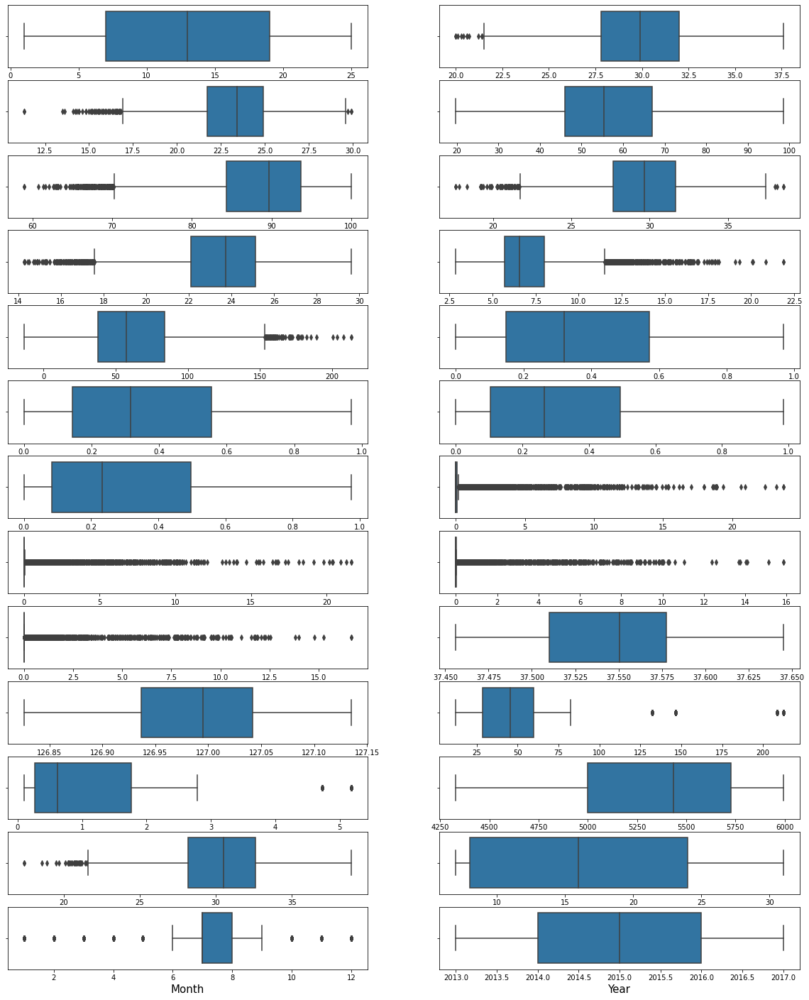

In [33]:
plt.figure(figsize=(20,25))
gr = 1
for column in df1:
    if gr<=26:
        ax = plt.subplot(13,2,gr)
        sns.boxplot(df1[column],orient='v')
        plt.xlabel(column,fontsize=15)
    gr+=1
plt.show()

#### Outliers exists in the dataset

#### Checking Skewness

In [34]:
df1.skew()

station             0.000000
Present_Tmax       -0.264137
Present_Tmin       -0.367538
LDAPS_RHmin         0.300220
LDAPS_RHmax        -0.855015
LDAPS_Tmax_lapse   -0.227880
LDAPS_Tmin_lapse   -0.581763
LDAPS_WS            1.579236
LDAPS_LH            0.673757
LDAPS_CC1           0.459458
LDAPS_CC2           0.472350
LDAPS_CC3           0.640735
LDAPS_CC4           0.666482
LDAPS_PPT1          5.393821
LDAPS_PPT2          5.775355
LDAPS_PPT3          6.457129
LDAPS_PPT4          6.825464
lat                 0.087062
lon                -0.285213
DEM                 1.723257
Slope               1.563020
Solar radiation    -0.511210
Next_Tmax          -0.340200
Day                 0.245514
Month              -0.705332
Year                0.000000
dtype: float64

#### LDAPS_RHmax,LDAPS_WS,LDAPS_LH,LDAPS_CC3,,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PT3,LDAPS_PT4,DEM,Slope, Month is highly skewed

#### DATA CLEANING

#### Dropping LDAPS_PPT3,LDAPS_PPT4,LDAPS_PPT2 as they have more outliers and they are highly skewed

In [55]:
df1 = df1.drop(columns=['LDAPS_PPT2','LDAPS_PPT3','LDAPS_PPT4','LDAPS_PPT1'],axis=1)
df1.head(3)

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_CC4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Day,Month,Year
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,...,0.130928,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,30.0,6.0,2013.0
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,...,0.127727,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,30.0,6.0,2013.0
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,...,0.142125,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,30.0,6.0,2013.0


#### Removing outliers

In [56]:
from scipy.stats import zscore
z = np.abs(zscore(df1))
print("Old shape : ",z.shape)
print(z)
print("Row numbers : ",np.where(z>3)[0])
print("Column numbers : ",np.where(z>3)[0])
index = np.where(z>3)[0]
dt1 = df1.drop(df1.index[index])
print("New shape : ",dt1.shape)

Old shape :  (7752, 22)
[[1.66431530e+00 3.61325771e-01 7.59529314e-01 ... 1.65406177e+00
  4.82876998e-01 1.41439603e+00]
 [1.52562236e+00 7.21084007e-01 6.76295896e-01 ... 1.65406177e+00
  4.82876998e-01 1.41439603e+00]
 [1.38692941e+00 6.19608090e-01 3.11881532e-02 ... 1.65406177e+00
  4.82876998e-01 1.41439603e+00]
 ...
 [1.66431530e+00 2.22171758e+00 2.42419767e+00 ... 1.65406177e+00
  4.10805804e-01 1.41439603e+00]
 [0.00000000e+00 3.30412736e+00 4.96281690e+00 ... 0.00000000e+00
  3.96874890e-16 0.00000000e+00]
 [0.00000000e+00 2.64912642e+00 2.77789093e+00 ... 0.00000000e+00
  3.96874890e-16 0.00000000e+00]]
Row numbers :  [  25   33   44  175  194  269  294  344  375  394  419  494  519  544
  569  575  584  594  969 1324 1424 1494 1652 1661 1663 1664 1670 1674
 1778 1779 1781 1791 1794 2175 2176 2177 2178 2179 2179 2180 2181 2181
 2182 2183 2184 2185 2186 2187 2188 2189 2190 2191 2192 2193 2194 2195
 2196 2197 2198 2199 2353 2354 2356 2369 2375 2378 2394 2441 2528 2544
 2569 

#### Calculating data loss

In [57]:
loss = (7752-7480)/7752*100
print("While removing outliers we loss ",loss,"% of data")

While removing outliers we loss  3.508771929824561 % of data


#### Splitting the dataset into x and y

In [58]:
x = dt1.drop('Next_Tmax',axis=1)
y = dt1['Next_Tmax']

#### Removing skewness by power transform method

In [59]:
from sklearn.preprocessing import power_transform
x_new = power_transform(x,method='yeo-johnson')
x_new

array([[-1.87005267, -0.42701746, -0.84948425, ...,  1.42954142,
        -0.57817814, -1.39517332],
       [-1.65673026,  0.70707951, -0.76730317, ...,  1.42954142,
        -0.57817814, -1.39517332],
       [-1.46212371,  0.59630591, -0.04565853, ...,  1.42954142,
        -0.57817814, -1.39517332],
       ...,
       [ 1.31210055, -2.10105171, -2.47513922, ...,  1.42954142,
         0.36413865,  1.39517332],
       [ 1.42715226, -2.10105171, -2.2647282 , ...,  1.42954142,
         0.36413865,  1.39517332],
       [ 1.54096993, -2.12918449, -2.37060934, ...,  1.42954142,
         0.36413865,  1.39517332]])

#### Checking skewness again

In [60]:
x_new = pd.DataFrame(x_new,columns=x.columns)
x_new.skew()

station            -0.201615
Present_Tmax       -0.031817
Present_Tmin       -0.019226
LDAPS_RHmin        -0.018093
LDAPS_RHmax        -0.109933
LDAPS_Tmax_lapse   -0.014950
LDAPS_Tmin_lapse   -0.022464
LDAPS_WS            0.009739
LDAPS_LH           -0.014034
LDAPS_CC1           0.050605
LDAPS_CC2           0.044895
LDAPS_CC3           0.086006
LDAPS_CC4           0.125734
lat                 0.088073
lon                -0.200886
DEM                 0.038006
Slope               0.234973
Solar radiation    -0.170351
Day                -0.034500
Month               0.039477
Year               -0.126591
dtype: float64

#### Skewness is removed from the dataset

##### Scaling x

In [61]:
scale = StandardScaler()
x_scaled = scale.fit_transform(x_new)

#### Applying PCA as multicollinearity exists

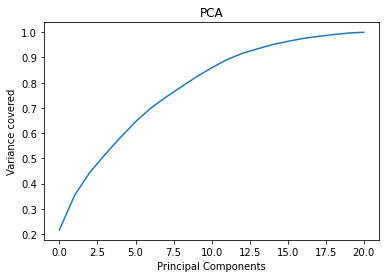

In [62]:
from sklearn.decomposition import PCA
pca = PCA()
pca.fit_transform(x_scaled)
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("Principal Components")
plt.ylabel("Variance covered")
plt.title("PCA")
plt.show()

In [63]:
pca = PCA(n_components=19)
principal = pca.fit_transform(x_scaled)
principal_x = pd.DataFrame(principal,columns=['PC1','PC2',"PC3","PC4",'PC5','PC6','PC7','PC8','PC9','PC10','PC11','PC12','PC13','PC14','PC15','PC16','PC17','PC18','PC19'])
principal_x

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19
0,0.549025,2.769236,-1.949860,0.320353,0.277993,0.522284,-0.873022,-0.685398,0.386338,-1.339638,0.486978,0.755889,1.862426,0.225638,0.907575,-0.174972,-0.352559,0.274929,-0.079070
1,-0.533694,1.004349,-0.804253,-0.048578,1.297622,-0.524813,-1.498170,-0.719735,0.121784,-1.290101,0.786482,0.579618,1.650034,-0.025719,1.092993,-0.035074,0.571672,-0.012185,-0.298896
2,-0.897833,-0.060244,-0.025003,0.193197,0.519234,-0.699578,-2.468248,-0.741225,0.318415,-1.452301,0.630881,0.187679,1.531949,-0.409632,1.198114,0.235522,0.075202,0.073949,-0.116830
3,-0.038614,1.409331,-1.995116,-0.531860,1.579114,0.024532,-0.937137,-0.789115,0.004825,-0.569038,0.400299,1.663817,1.584297,-0.178590,0.792864,0.718990,0.205255,-0.606745,-0.234412
4,-0.508298,1.101272,-0.692418,-0.176975,1.554969,-0.716589,-0.812276,-0.945666,0.208136,0.227625,1.697943,-0.651664,1.968604,-0.440338,1.047080,-0.282343,-0.028044,-0.343199,-0.315329
5,-0.673233,0.003797,0.185008,0.418676,0.417082,0.006464,-1.182957,-0.857106,0.185736,-0.888945,1.378455,-0.625550,1.769173,-0.563840,1.393186,0.040357,0.112717,0.676423,0.192309
6,-0.487487,-1.066936,1.214526,0.413496,2.597269,0.081736,0.546130,-0.581229,0.711645,-1.474765,1.089816,0.832241,1.599060,1.450028,1.472295,-0.208596,-0.932005,-0.260791,0.139421
7,-0.335409,-0.103473,0.290841,0.812922,-1.082081,1.400717,-0.425320,-0.962617,-0.290503,-1.316806,1.208354,0.078668,1.494553,0.593689,1.680326,0.307409,-0.462188,-0.499010,-0.097892
8,-0.050825,0.124126,0.966075,1.042909,0.298169,1.233499,0.545684,-0.744347,0.051998,-1.501766,1.308821,0.261383,1.648265,1.222999,1.564471,-0.421440,-0.073148,0.367017,0.080183
9,0.495870,1.807273,-0.579812,0.903383,-1.519100,1.909826,0.102097,-1.053046,-0.536653,-0.404595,1.411407,-0.164344,1.656199,0.339432,1.588229,-0.144126,0.287702,-0.225684,-0.267305


#### Finding the best Random state

In [64]:
from sklearn.linear_model import LinearRegression
max_score = 0
max_rs = 0
for i in range(1,400):
    x_train,x_test,y_train,y_test = train_test_split(principal_x,y,test_size=0.25,random_state = i)
    lr = LinearRegression()
    lr.fit(x_train,y_train)
    y_pred = lr.predict(x_test)
    score = lr.score(x_train,y_train)
    if score>max_score:
        max_score = score
        max_rs = i
print("Maximum score is",max_score,"when",max_rs,"is the random state")

Maximum score is 0.7414896510366934 when 187 is the random state


#### Splitting the dataset into train and test

In [65]:
x_train,x_test,y_train,y_test = train_test_split(principal_x,y,test_size=0.25,random_state = 187)

#### i) Decision Tree Regressor

In [66]:
dt = DecisionTreeRegressor()
dt.fit(x_train,y_train)
y_pred_dt = dt.predict(x_test)
print("Score in training dataset is ",dt.score(x_train,y_train))
print("Score in testing dataset is ",dt.score(x_test,y_test))
print("MAE is : ",mean_absolute_error(y_test,y_pred_dt))
print("MSE is :",mean_squared_error(y_test,y_pred_dt))
print("RMSE is :",np.sqrt(mean_squared_error(y_test,y_pred_dt)))

Score in training dataset is  1.0
Score in testing dataset is  0.5889417192714359
MAE is :  1.3644519322292021
MSE is : 3.504345019224084
RMSE is : 1.871989588439018


#### Decision tree works with an accuracy of 55.79%

#### ii)Random Forest Regressor

In [67]:
rf = RandomForestRegressor()
rf.fit(x_train,y_train)
y_pred_rf = rf.predict(x_test)
print("Score in training dataset is ",rf.score(x_train,y_train))
print("Score in testing dataset is ",rf.score(x_test,y_test))
print("MAE is : ",mean_absolute_error(y_test,y_pred_rf))
print("MSE is :",mean_squared_error(y_test,y_pred_rf))
print("RMSE is :",np.sqrt(mean_squared_error(y_test,y_pred_rf)))

Score in training dataset is  0.9779703146934247
Score in testing dataset is  0.8181755894905112
MAE is :  0.9451202467853863
MSE is : 1.5500854677174876
RMSE is : 1.2450242839870584


#### Random Forest works with an accuracy of 81.36%

#### iii)Gradient Boosting

In [68]:
from sklearn.ensemble import GradientBoostingRegressor
gbr = GradientBoostingRegressor()
gbr.fit(x_train,y_train)
y_pred_gbr = gbr.predict(x_test)
print("Score in training dataset is ",gbr.score(x_train,y_train))
print("Score in training dataset is ",gbr.score(x_test,y_test))
print("MAE is : ",mean_absolute_error(y_test,y_pred_gbr))
print("MSE is :",mean_squared_error(y_test,y_pred_gbr))
print("RMSE is :",np.sqrt(mean_squared_error(y_test,y_pred_gbr)))

Score in training dataset is  0.8223066029529092
Score in training dataset is  0.7442424225116064
MAE is :  1.1302353438046537
MSE is : 2.1803788776903454
RMSE is : 1.4766106046247756


#### Gradient Boosting works with an accuracy of 74.19%

#### iv)SVR

In [69]:
svr = SVR()
svr.fit(x_train,y_train)
y_pred_svr = svr.predict(x_test)
print("Score in training dataset is ",svr.score(x_train,y_train))
print("Score in testing dataset is ",svr.score(x_test,y_test))
print("MAE is : ",mean_absolute_error(y_test,y_pred_svr))
print("MSE is :",mean_squared_error(y_test,y_pred_svr))
print("RMSE is :",np.sqrt(mean_squared_error(y_test,y_pred_svr)))

Score in training dataset is  0.8694778471534568
Score in testing dataset is  0.8143802354506349
MAE is :  0.9005730178835647
MSE is : 1.5824415365509845
RMSE is : 1.2579513251914736


#### SVR works with an accuracy of 81.23%

#### v) XGB Regressor

In [70]:
xgbr = XGBRegressor()
xgbr.fit(x_train,y_train)
y_pred_xgbr = xgbr.predict(x_test)
print("Score in training dataset is ",xgbr.score(x_train,y_train))
print("Score in training dataset is ",xgbr.score(x_test,y_test))
print("MAE is : ",mean_absolute_error(y_test,y_pred_xgbr))
print("MSE is :",mean_squared_error(y_test,y_pred_xgbr))
print("RMSE is :",np.sqrt(mean_squared_error(y_test,y_pred_xgbr)))

Score in training dataset is  0.9805870527389163
Score in training dataset is  0.8151591485441178
MAE is :  0.949431479988767
MSE is : 1.5758011637680371
RMSE is : 1.2553091905056846


#### XGB works with an accuracy of 81.67%

#### Finding the cross-validation score

In [76]:
cvs = cross_val_score(lr,principal_x,y,cv=5)
print("Cross validation score of Linear Regression model is : ",cvs.mean())

Cross validation score of Linear Regression model is :  0.6473498693612123


In [71]:
cvs = cross_val_score(dt,principal_x,y,cv=5)
print("Cross validation score of DecisionTreeRegressor model is : ",cvs.mean())

Cross validation score of DecisionTreeRegressor model is :  0.2530616022026635


In [72]:
cvs = cross_val_score(rf,principal_x,y,cv=5)
print("Cross validation score of Random forest model is : ",cvs.mean())

Cross validation score of Random forest model is :  0.6032338063510176


In [73]:
cvs = cross_val_score(gbr,principal_x,y,cv=5)
print("Cross validation score of GradientDescent Boosting model is : ",cvs.mean())

Cross validation score of GradientDescent Boosting model is :  0.6340170386916579


In [74]:
cvs = cross_val_score(svr,principal_x,y,cv=5)
print("Cross validation score of SVR model is : ",cvs.mean())

Cross validation score of SVR model is :  0.6312265409103003


In [75]:
cvs = cross_val_score(xgbr,principal_x,y,cv=5)
print("Cross validation score of XGBRegressor model is : ",cvs.mean())

Cross validation score of XGBRegressor model is :  0.564884334123146


#### Finding the Best Model

In [78]:
models = pd.DataFrame([['Linear Regression','74.15','64.73','9.42'],["DecisionTreeRegressor","58.89","25.31","33.58"],["RandomForestRegressor","81.82","60.32","21.5"],["GradientBoostingRegressor","74.42","63.40","11.02"],["SVR","81.44","63.12","18.32"],["XGBRegressor","81.52","56.49","25.03"]],columns=["Model","Score","Cross Validation Score","Difference"])
models

,Model,Score,Cross Validation Score,Difference
0,Linear Regression,74.15,64.73,9.42
1,DecisionTreeRegressor,58.89,25.31,33.58
2,RandomForestRegressor,81.82,60.32,21.5
3,GradientBoostingRegressor,74.42,63.40,11.02
4,SVR,81.44,63.12,18.32
5,XGBRegressor,81.52,56.49,25.03


#### Linear Regression model turns out to the best model

#### Linear Regression model doesn't have hyper parameter tuning as such so cross validating by Lasso and Ridge method

In [79]:
lassocv = LassoCV(alphas=None,max_iter=1000,normalize=True)
lassocv.fit(x_train,y_train)
alpha = lassocv.alpha_
lasso_reg = Lasso(alpha)
lasso_reg.fit(x_train,y_train)
print("Score after Cross validation by L1 is ",lasso_reg.score(x_test,y_test))

Score after Cross validation by L1 is  0.6914127001509758


In [80]:
from sklearn.linear_model import Ridge,RidgeCV
ridgecv = RidgeCV(alphas=np.arange(0.0001,1,0.01),normalize=True)
ridgecv.fit(x_train,y_train)
alpha = ridgecv.alpha_
ridge_reg = Ridge(alpha)
ridge_reg.fit(x_train,y_train)
print("Score after Cross validation by L2 is ",ridge_reg.score(x_test,y_test))

Score after Cross validation by L2 is  0.6914117454489812


#### Saving this model

In [81]:
filename = 'Temp_Max.pkl'
pickle.dump(lr,open(filename,'wb'))

##### Doing Analysis on T_min

In [3]:
df2 = df.drop('Next_Tmax',axis=1)
df2.head(3)

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,23.9


#### Converting date to datetime format

In [4]:
df2['Date']=pd.to_datetime(df2['Date'])

#### Extracting date month and year

In [5]:
df2['Day'] = df2['Date'].dt.day
df2['Month'] = df2['Date'].dt.month
df2['Year'] = df2['Date'].dt.year
df2 = df2.drop('Date',axis=1)
df2.head(3)

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmin,Day,Month,Year
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,...,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,21.2,30.0,6.0,2013.0
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,...,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,22.5,30.0,6.0,2013.0
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,...,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,23.9,30.0,6.0,2013.0


#### Checking for null values

In [7]:
pd.set_option('display.max_rows',None)
df2.isnull().sum()

station              2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmin           27
Day                  2
Month                2
Year                 2
dtype: int64

#### Replacing null values with mean

In [9]:
df2["station"] = df2['station'].fillna(df2['station'].mean())
df2["Present_Tmax"] = df2['Present_Tmax'].fillna(df2['Present_Tmax'].mean())
df2["Present_Tmin"] = df2['Present_Tmin'].fillna(df2['Present_Tmin'].mean())
df2["LDAPS_RHmin"] = df2['LDAPS_RHmin'].fillna(df2['LDAPS_RHmin'].mean())
df2["LDAPS_RHmax"] = df2['LDAPS_RHmax'].fillna(df2['LDAPS_RHmax'].mean())
df2["LDAPS_Tmax_lapse"] = df2['LDAPS_Tmax_lapse'].fillna(df2['LDAPS_Tmax_lapse'].mean())
df2["LDAPS_Tmin_lapse"] = df2['LDAPS_Tmin_lapse'].fillna(df2['LDAPS_Tmin_lapse'].mean())
df2["LDAPS_WS"] = df2['LDAPS_WS'].fillna(df2['LDAPS_WS'].mean())
df2["LDAPS_LH"] = df2['LDAPS_LH'].fillna(df2['LDAPS_LH'].mean())
df2["LDAPS_CC1"] = df2['LDAPS_CC1'].fillna(df2['LDAPS_CC1'].mean())
df2["LDAPS_CC2"] = df2['LDAPS_CC2'].fillna(df2['LDAPS_CC2'].mean())
df2["LDAPS_CC3"] = df2['LDAPS_CC3'].fillna(df2['LDAPS_CC3'].mean())
df2["LDAPS_CC4"] = df2['LDAPS_CC4'].fillna(df2['LDAPS_CC4'].mean())
df2["LDAPS_PPT1"] = df2['LDAPS_PPT1'].fillna(df2['LDAPS_PPT1'].mean())
df2["LDAPS_PPT2"] = df2['LDAPS_PPT2'].fillna(df2['LDAPS_PPT2'].mean())
df2["LDAPS_PPT3"] = df2['LDAPS_PPT3'].fillna(df2['LDAPS_PPT3'].mean())
df2["LDAPS_PPT4"] = df2['LDAPS_PPT4'].fillna(df2['LDAPS_PPT4'].mean())
df2["Next_Tmin"] = df2['Next_Tmin'].fillna(df2['Next_Tmin'].mean())
df2["Day"] = df2['Day'].fillna(df2['Day'].mean())
df2["Month"] = df2['Month'].fillna(df2['Month'].mean())
df2["Year"] = df2['Year'].fillna(df2['Year'].mean())

In [10]:
df2.isnull().sum()

station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmin           0
Day                 0
Month               0
Year                0
dtype: int64

### EDA

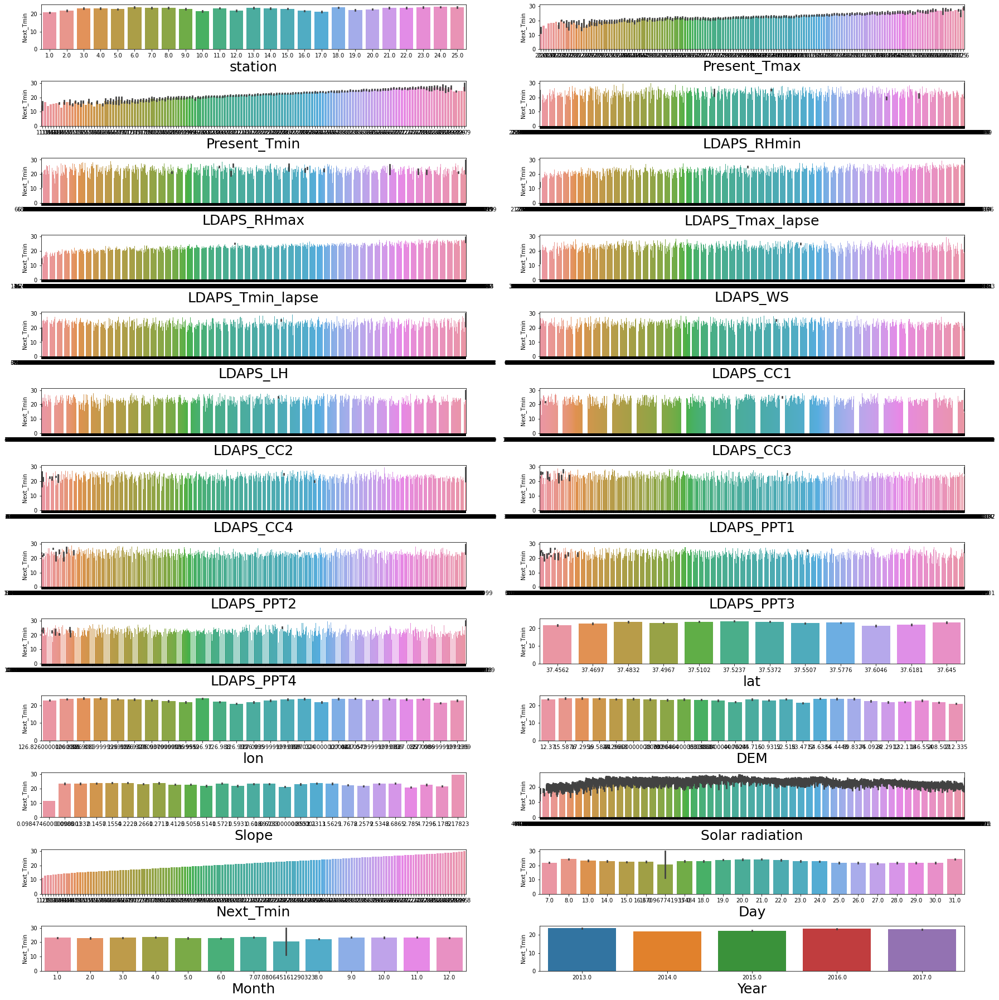

In [12]:
plt.figure(figsize=(25,25),facecolor="white")
plotnumber=1
for column in df2:
    if plotnumber<=26:
        ax=plt.subplot(13,2,plotnumber)
        sns.barplot(x=df2[column],y=df2['Next_Tmin'],data=df2)
        plt.xlabel(column,fontsize=25)
    plotnumber+=1
plt.tight_layout()

#### Finding the correlation

In [13]:
df2.corr()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmin,Day,Month,Year
station,1.000000e+00,0.112655,0.131646,-0.066733,-0.166984,0.069107,0.104758,0.005277,-0.133357,0.006919,...,-0.010401,-2.375015e-01,-1.187044e-01,-2.558297e-01,-9.006090e-02,-0.019001,0.128293,-7.467287e-18,9.188159e-18,0.000000e+00
Present_Tmax,1.126554e-01,1.000000,0.618760,-0.204571,-0.301787,0.570129,0.623496,-0.121820,0.135463,-0.311805,...,-0.099607,-5.261489e-02,9.019776e-03,-1.871206e-01,-1.058092e-01,-0.025439,0.622741,-1.438070e-01,-1.150750e-03,5.980007e-02
Present_Tmin,1.316462e-01,0.618760,1.000000,0.123143,-0.015140,0.464151,0.762993,-0.034675,-0.009258,0.084447,...,-0.062965,-7.847529e-02,-4.346122e-02,-2.502747e-01,-1.463390e-01,0.053578,0.796670,-1.082721e-01,-3.434226e-03,3.739568e-02
LDAPS_RHmin,-6.673316e-02,-0.204571,0.123143,1.000000,0.579141,-0.564580,0.089476,0.294361,-0.070858,0.613818,...,0.168595,8.709887e-02,-7.623712e-02,1.021149e-01,1.237439e-01,0.244080,0.095019,-6.583711e-02,-5.394021e-02,-2.044507e-03
LDAPS_RHmax,-1.669845e-01,-0.301787,-0.015140,0.579141,1.000000,-0.373404,-0.114143,0.135333,0.238579,0.436652,...,0.117853,1.957977e-01,2.566694e-02,1.771681e-01,2.195989e-01,0.149261,-0.071997,-1.300684e-02,-3.998985e-02,-1.418320e-01
LDAPS_Tmax_lapse,6.910718e-02,0.570129,0.464151,-0.564580,-0.373404,1.000000,0.654021,-0.311996,0.048010,-0.438439,...,-0.160273,-4.209291e-02,9.066575e-02,-1.788954e-01,-1.623324e-01,0.047971,0.586868,-1.603214e-01,-2.168992e-02,1.617217e-02
LDAPS_Tmin_lapse,1.047582e-01,0.623496,0.762993,0.089476,-0.114143,0.654021,1.000000,-0.130035,-0.134761,0.010901,...,-0.094655,-9.625683e-02,-2.670103e-02,-1.954553e-01,-1.858487e-01,0.159975,0.880176,-1.779545e-01,-2.749581e-02,-4.693413e-03
LDAPS_WS,5.277000e-03,-0.121820,-0.034675,0.294361,0.135333,-0.311996,-0.130035,1.000000,0.006711,0.289445,...,0.144085,3.665702e-02,-5.946615e-02,1.910530e-01,1.716286e-01,0.121759,-0.096576,-2.913467e-02,-8.128770e-02,-1.113577e-01
LDAPS_LH,-1.333566e-01,0.135463,-0.009258,-0.070858,0.238579,0.048010,-0.134761,0.006711,1.000000,-0.147296,...,0.019979,1.332208e-01,2.582205e-02,5.513344e-02,8.678088e-02,-0.047384,-0.055440,-1.209485e-02,-2.274775e-02,5.707733e-02
LDAPS_CC1,6.918787e-03,-0.311805,0.084447,0.613818,0.436652,-0.438439,0.010901,0.289445,-0.147296,1.000000,...,0.091722,-8.130615e-03,-6.842827e-03,-1.409033e-02,-2.075199e-02,0.218309,-0.011028,-2.013716e-02,-7.627189e-02,-6.647797e-02


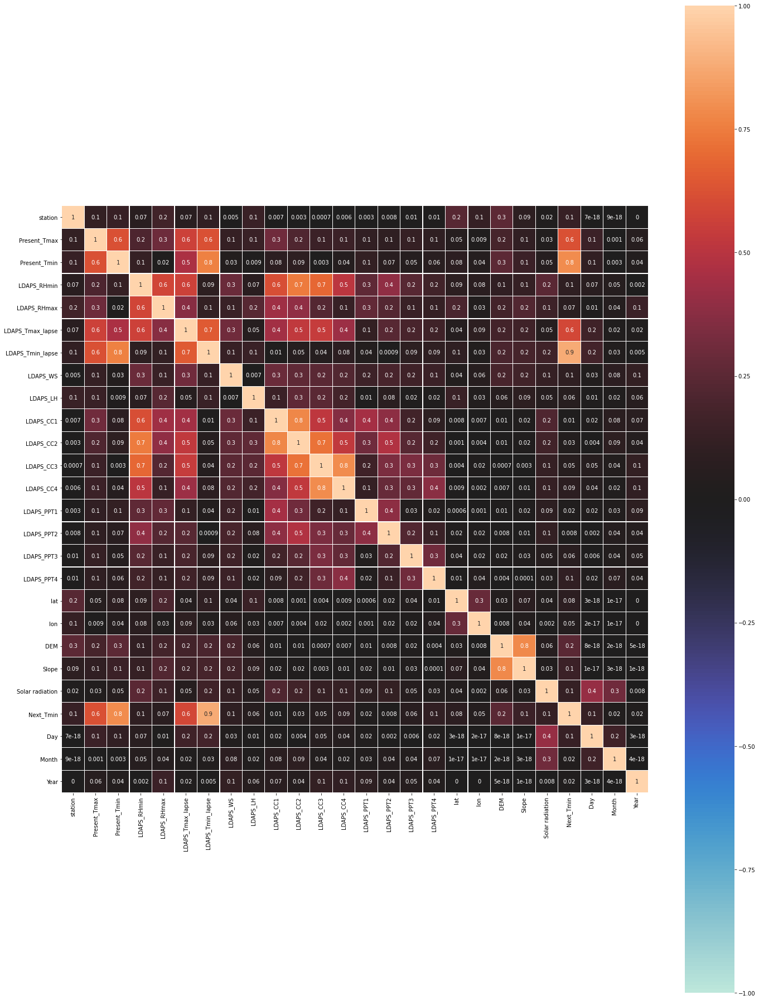

In [14]:
df2_corr = df2.corr().abs()
plt.figure(figsize=(20,25))
sns.heatmap(df2_corr,vmin=-1,vmax=1,annot=True,square = True,center=0,fmt='.1g',linewidth=.2)
plt.tight_layout()

#### Multicollinearity exists in the dataset
#### LDAPS_Tmin_lapse is having high correlation with Next_Tmin followed by Present_Tmin, Present_Tmax and LDAPS_Tmax_lapse

#### Statistical Analysis

In [15]:
df2.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmin,Day,Month,Year
count,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,...,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000
mean,13.000000,29.768211,23.225059,56.759372,88.374804,29.613447,23.512589,7.097875,62.505019,0.368774,...,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,22.932220,16.370968,7.080645,2015.000000
std,7.210637,2.956557,2.403036,14.596973,7.157124,2.932898,2.333973,2.173245,33.567001,0.261185,...,1.200364,0.050352,0.079435,54.279780,1.370444,429.158867,2.483276,8.240268,2.238075,1.414122
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,11.300000,7.000000,1.000000,2013.000000
25%,7.000000,27.800000,21.700000,46.046162,84.316923,27.693091,22.114651,5.686487,37.532764,0.148321,...,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,21.400000,8.000000,7.000000,2014.000000
50%,13.000000,29.900000,23.400000,55.313244,89.699505,29.662273,23.735942,6.563068,57.310630,0.320110,...,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,23.100000,16.000000,7.000000,2015.000000
75%,19.000000,32.000000,24.900000,67.038254,93.704500,31.683819,25.134000,8.007471,83.904586,0.571696,...,0.000693,37.577600,127.042000,59.832400,1.767800,5728.316406,24.600000,24.000000,8.000000,2016.000000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,29.800000,31.000000,12.000000,2017.000000


#### Checking for outliers

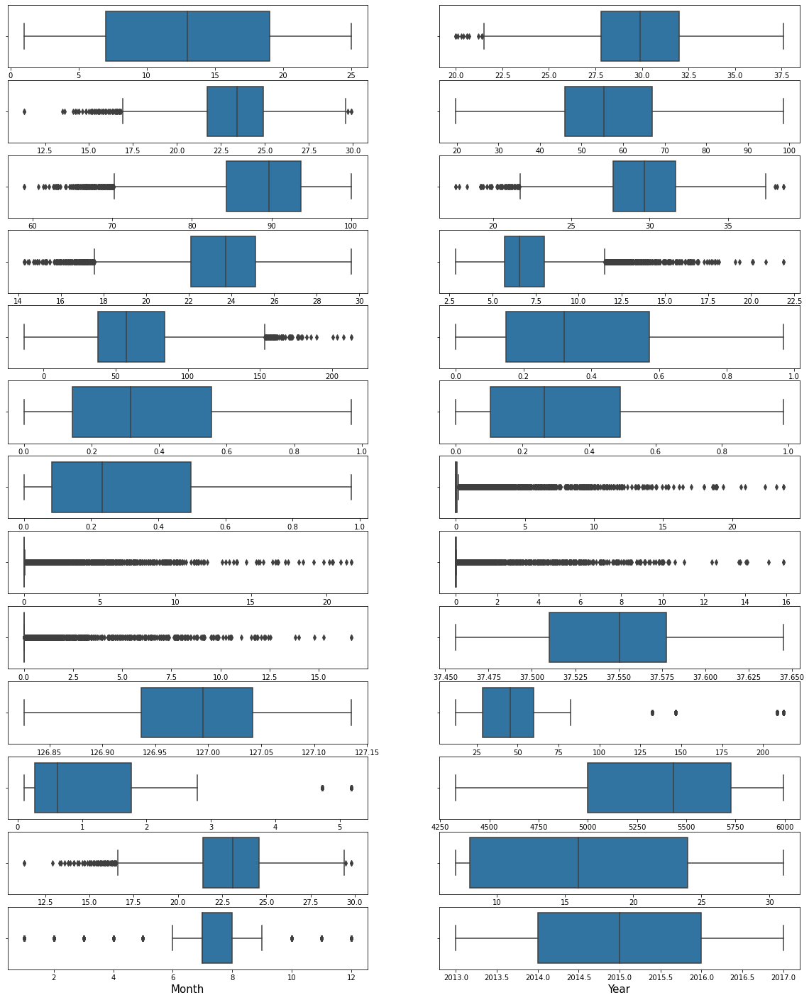

In [16]:
plt.figure(figsize=(20,25))
gr = 1
for column in df2:
    if gr<=26:
        ax = plt.subplot(13,2,gr)
        sns.boxplot(df2[column],orient='v')
        plt.xlabel(column,fontsize=15)
    gr+=1
plt.show()

#### Outliers exist in the dataset

#### Checking skewness

In [17]:
df2.skew()

station             0.000000
Present_Tmax       -0.264137
Present_Tmin       -0.367538
LDAPS_RHmin         0.300220
LDAPS_RHmax        -0.855015
LDAPS_Tmax_lapse   -0.227880
LDAPS_Tmin_lapse   -0.581763
LDAPS_WS            1.579236
LDAPS_LH            0.673757
LDAPS_CC1           0.459458
LDAPS_CC2           0.472350
LDAPS_CC3           0.640735
LDAPS_CC4           0.666482
LDAPS_PPT1          5.393821
LDAPS_PPT2          5.775355
LDAPS_PPT3          6.457129
LDAPS_PPT4          6.825464
lat                 0.087062
lon                -0.285213
DEM                 1.723257
Slope               1.563020
Solar radiation    -0.511210
Next_Tmin          -0.404447
Day                 0.245514
Month              -0.705332
Year                0.000000
dtype: float64

#### Dataset is highly skewed

### Data Cleaning

#### Dropping LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4 and LDAPS_PPT1

In [18]:
df2 = df2.drop(columns=['LDAPS_PPT2','LDAPS_PPT3','LDAPS_PPT4','LDAPS_PPT1'],axis=1)
df2.head(3)

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_CC4,lat,lon,DEM,Slope,Solar radiation,Next_Tmin,Day,Month,Year
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,...,0.130928,37.6046,126.991,212.3350,2.7850,5992.895996,21.2,30.0,6.0,2013.0
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,...,0.127727,37.6046,127.032,44.7624,0.5141,5869.312500,22.5,30.0,6.0,2013.0
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,...,0.142125,37.5776,127.058,33.3068,0.2661,5863.555664,23.9,30.0,6.0,2013.0


#### Removing outliers

In [19]:
from scipy.stats import zscore
z = np.abs(zscore(df2))
print("Old shape : ",z.shape)
print(z)
print("Row numbers : ",np.where(z>3)[0])
print("Column numbers : ",np.where(z>3)[0])
index = np.where(z>3)[0]
dt2 = df2.drop(df2.index[index])
print("New shape : ",dt2.shape)

Old shape :  (7752, 22)
[[1.66431530e+00 3.61325771e-01 7.59529314e-01 ... 1.65406177e+00
  4.82876998e-01 1.41439603e+00]
 [1.52562236e+00 7.21084007e-01 6.76295896e-01 ... 1.65406177e+00
  4.82876998e-01 1.41439603e+00]
 [1.38692941e+00 6.19608090e-01 3.11881532e-02 ... 1.65406177e+00
  4.82876998e-01 1.41439603e+00]
 ...
 [1.66431530e+00 2.22171758e+00 2.42419767e+00 ... 1.65406177e+00
  4.10805804e-01 1.41439603e+00]
 [0.00000000e+00 3.30412736e+00 4.96281690e+00 ... 0.00000000e+00
  3.96874890e-16 0.00000000e+00]
 [0.00000000e+00 2.64912642e+00 2.77789093e+00 ... 0.00000000e+00
  3.96874890e-16 0.00000000e+00]]
Row numbers :  [  25   33   44  175  194  269  294  344  375  394  419  494  519  544
  569  575  584  594  969 1324 1424 1494 1652 1661 1663 1664 1670 1674
 1778 1779 1781 1791 1794 2175 2176 2177 2178 2179 2179 2180 2181 2181
 2182 2183 2184 2185 2186 2187 2188 2189 2190 2191 2192 2193 2194 2195
 2196 2197 2198 2199 2353 2354 2356 2369 2375 2378 2394 2441 2528 2544
 2569 

#### Calculating Data loss

In [20]:
loss = (7752-7471)/7752*100
print("While removing outliers we loss ",loss,"% of data")

While removing outliers we loss  3.6248710010319916 % of data


#### Splitting the dataset x and y

In [22]:
x = dt2.drop('Next_Tmin',axis=1)
y = dt2['Next_Tmin']

#### Removing skewness by Power Transform method

In [23]:
from sklearn.preprocessing import power_transform
x_new = power_transform(x,method='yeo-johnson')
x_new

array([[-1.86930796, -0.42783296, -0.85284521, ...,  1.43005189,
        -0.57861566, -1.39721476],
       [-1.65580355,  0.70659471, -0.77049229, ...,  1.43005189,
        -0.57861566, -1.39721476],
       [-1.46109067,  0.59582323, -0.04756502, ...,  1.43005189,
        -0.57861566, -1.39721476],
       ...,
       [ 1.31160066, -2.10405554, -2.48318226, ...,  1.43005189,
         0.36379291,  1.42826397],
       [ 1.42651386, -2.10405554, -2.27201093, ...,  1.43005189,
         0.36379291,  1.42826397],
       [ 1.54019043, -2.13224629, -2.37826817, ...,  1.43005189,
         0.36379291,  1.42826397]])

In [24]:
x_new = pd.DataFrame(x_new,columns=x.columns)
x_new.skew()

station            -0.201548
Present_Tmax       -0.031832
Present_Tmin       -0.018968
LDAPS_RHmin        -0.018111
LDAPS_RHmax        -0.109898
LDAPS_Tmax_lapse   -0.015013
LDAPS_Tmin_lapse   -0.022169
LDAPS_WS            0.009725
LDAPS_LH           -0.013700
LDAPS_CC1           0.050362
LDAPS_CC2           0.044562
LDAPS_CC3           0.085491
LDAPS_CC4           0.125184
lat                 0.088798
lon                -0.200501
DEM                 0.038218
Slope               0.234963
Solar radiation    -0.170152
Day                -0.034050
Month               0.040013
Year                0.022160
dtype: float64

#### Skewness is removed from the dataset

#### Scaling X

In [25]:
scale = StandardScaler()
x_scaled = scale.fit_transform(x_new)

#### Applying PCA

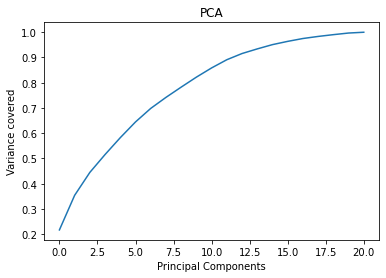

In [26]:
from sklearn.decomposition import PCA
pca = PCA()
pca.fit_transform(x_scaled)
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("Principal Components")
plt.ylabel("Variance covered")
plt.title("PCA")
plt.show()

In [27]:
pca = PCA(n_components=19)
principal = pca.fit_transform(x_scaled)
principal_x = pd.DataFrame(principal,columns=['PC1','PC2',"PC3","PC4",'PC5','PC6','PC7','PC8','PC9','PC10','PC11','PC12','PC13','PC14','PC15','PC16','PC17','PC18','PC19'])
principal_x

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19
0,0.557773,2.783414,-1.928201,0.312051,0.234387,0.441614,-0.846939,-0.711049,0.411872,-1.293782,0.563910,0.723859,1.860462,0.199589,0.892317,-0.185628,-0.360420,0.268381,-0.079516
1,-0.536625,1.027867,-0.785184,-0.040563,1.269881,-0.621831,-1.439432,-0.732846,0.138936,-1.247883,0.828430,0.531293,1.646395,-0.052780,1.076013,-0.080659,0.570805,-0.015782,-0.301441
2,-0.908697,-0.040793,-0.011371,0.188561,0.478859,-0.855979,-2.385482,-0.756361,0.367498,-1.411671,0.674398,0.149253,1.530966,-0.430101,1.184453,0.212271,0.081739,0.069493,-0.120144
3,-0.039525,1.436275,-1.975243,-0.522334,1.559858,-0.037424,-0.921269,-0.791871,-0.003375,-0.539688,0.467608,1.634322,1.577776,-0.202973,0.782072,0.687164,0.233703,-0.613014,-0.238132
4,-0.508998,1.119400,-0.674869,-0.163196,1.541520,-0.776369,-0.749929,-0.940446,0.093653,0.306458,1.614321,-0.748980,1.951977,-0.472818,1.033228,-0.309377,-0.036758,-0.348443,-0.312181
5,-0.682835,0.017272,0.198891,0.407400,0.381862,-0.083152,-1.141655,-0.861739,0.148674,-0.827364,1.353014,-0.702166,1.763145,-0.588560,1.377932,0.018280,0.111281,0.672270,0.189831
6,-0.502936,-1.054429,1.226183,0.422801,2.581913,0.105437,0.565122,-0.613142,0.684029,-1.391207,1.190447,0.780505,1.603833,1.423643,1.451899,-0.211019,-0.932918,-0.268159,0.140899
7,-0.345912,-0.096923,0.302130,0.771809,-1.129323,1.334893,-0.449016,-0.960207,-0.319123,-1.279640,1.230971,0.014697,1.497820,0.571825,1.664762,0.293279,-0.449022,-0.507030,-0.098846
8,-0.058172,0.129145,0.980527,1.019402,0.257603,1.233240,0.523015,-0.758921,0.015474,-1.443561,1.358705,0.193893,1.651887,1.194395,1.541832,-0.449584,-0.086198,0.362452,0.079341
9,0.498747,1.809658,-0.561476,0.859964,-1.571409,1.867048,0.050694,-1.036389,-0.622053,-0.370578,1.371734,-0.244877,1.652224,0.312522,1.571603,-0.183078,0.283526,-0.230741,-0.268684


#### Finding the best Random state

In [28]:
from sklearn.linear_model import LinearRegression
max_score = 0
max_rs = 0
for i in range(1,400):
    x_train,x_test,y_train,y_test = train_test_split(principal_x,y,test_size=0.25,random_state = i)
    lr = LinearRegression()
    lr.fit(x_train,y_train)
    y_pred = lr.predict(x_test)
    score = lr.score(x_train,y_train)
    if score>max_score:
        max_score = score
        max_rs = i
print("Maximum score is",max_score,"when",max_rs,"is the random state")

Maximum score is 0.8158246490269153 when 133 is the random state


#### Splitting the dataset into train and test

In [29]:
x_train,x_test,y_train,y_test = train_test_split(principal_x,y,test_size=0.25,random_state = 133)

### Model Training

#### i) Decision Tree

In [30]:
dt = DecisionTreeRegressor()
dt.fit(x_train,y_train)
y_pred_dt = dt.predict(x_test)
print("Score in training dataset is ",dt.score(x_train,y_train))
print("Score in testing dataset is ",dt.score(x_test,y_test))
print("MAE is : ",mean_absolute_error(y_test,y_pred_dt))
print("MSE is :",mean_squared_error(y_test,y_pred_dt))
print("RMSE is :",np.sqrt(mean_squared_error(y_test,y_pred_dt)))

Score in training dataset is  1.0
Score in testing dataset is  0.6546719686246105
MAE is :  1.0053705674864695
MSE is : 1.8119405262653578
RMSE is : 1.3460834024180515


#### ii) Random Forest

In [31]:
rf = RandomForestRegressor()
rf.fit(x_train,y_train)
y_pred_rf = rf.predict(x_test)
print("Score in training dataset is ",rf.score(x_train,y_train))
print("Score in testing dataset is ",rf.score(x_test,y_test))
print("MAE is : ",mean_absolute_error(y_test,y_pred_rf))
print("MSE is :",mean_squared_error(y_test,y_pred_rf))
print("RMSE is :",np.sqrt(mean_squared_error(y_test,y_pred_rf)))

Score in training dataset is  0.9804879288512821
Score in testing dataset is  0.8489820190089021
MAE is :  0.6917482256779142
MSE is : 0.7923932466840071
RMSE is : 0.8901647300831499


#### iii) Gradient Boosting Regressor

In [32]:
from sklearn.ensemble import GradientBoostingRegressor
gbr = GradientBoostingRegressor()
gbr.fit(x_train,y_train)
y_pred_gbr = gbr.predict(x_test)
print("Score in training dataset is ",gbr.score(x_train,y_train))
print("Score in training dataset is ",gbr.score(x_test,y_test))
print("MAE is : ",mean_absolute_error(y_test,y_pred_gbr))
print("MSE is :",mean_squared_error(y_test,y_pred_gbr))
print("RMSE is :",np.sqrt(mean_squared_error(y_test,y_pred_gbr)))

Score in training dataset is  0.8737682176012015
Score in training dataset is  0.8177435363821121
MAE is :  0.7641455754715036
MSE is : 0.9563019581346213
RMSE is : 0.9779069271329563


#### iv) SVR

In [33]:
svr = SVR()
svr.fit(x_train,y_train)
y_pred_svr = svr.predict(x_test)
print("Score in training dataset is ",svr.score(x_train,y_train))
print("Score in testing dataset is ",svr.score(x_test,y_test))
print("MAE is : ",mean_absolute_error(y_test,y_pred_svr))
print("MSE is :",mean_squared_error(y_test,y_pred_svr))
print("RMSE is :",np.sqrt(mean_squared_error(y_test,y_pred_svr)))

Score in training dataset is  0.9204220402927051
Score in testing dataset is  0.8809374279928325
MAE is :  0.5887011972635181
MSE is : 0.6247228136156137
RMSE is : 0.7903940875383707


#### v) XGBoost Regressor

In [34]:
xgbr = XGBRegressor()
xgbr.fit(x_train,y_train)
y_pred_xgbr = xgbr.predict(x_test)
print("Score in training dataset is ",xgbr.score(x_train,y_train))
print("Score in training dataset is ",xgbr.score(x_test,y_test))
print("MAE is : ",mean_absolute_error(y_test,y_pred_xgbr))
print("MSE is :",mean_squared_error(y_test,y_pred_xgbr))
print("RMSE is :",np.sqrt(mean_squared_error(y_test,y_pred_xgbr)))

Score in training dataset is  0.984635752756077
Score in training dataset is  0.8601043717058565
MAE is :  0.6625018891805301
MSE is : 0.7340341221184116
RMSE is : 0.8567579133678379


#### Finding the Cross-Validation score

In [35]:
cvs = cross_val_score(lr,principal_x,y,cv=5)
print("Cross validation score of Linear Regression model is : ",cvs.mean())

Cross validation score of Linear Regression model is :  0.749332918436085


In [36]:
cvs = cross_val_score(dt,principal_x,y,cv=5)
print("Cross validation score of DecisionTreeRegressor model is : ",cvs.mean())

Cross validation score of DecisionTreeRegressor model is :  0.39833497968037784


In [37]:
cvs = cross_val_score(rf,principal_x,y,cv=5)
print("Cross validation score of Random forest model is : ",cvs.mean())

Cross validation score of Random forest model is :  0.7015717944542288


In [38]:
cvs = cross_val_score(gbr,principal_x,y,cv=5)
print("Cross validation score of GradientDescent Boosting model is : ",cvs.mean())

Cross validation score of GradientDescent Boosting model is :  0.7363302420260543


In [39]:
cvs = cross_val_score(svr,principal_x,y,cv=5)
print("Cross validation score of SVR model is : ",cvs.mean())

Cross validation score of SVR model is :  0.6958346232341466


In [40]:
cvs = cross_val_score(xgbr,principal_x,y,cv=5)
print("Cross validation score of XGBRegressor model is : ",cvs.mean())

Cross validation score of XGBRegressor model is :  0.6969900609440228


#### Finding the Best model

In [41]:
models = pd.DataFrame([['Linear Regressor','81.58','74.93','6.65'],["DecisionTreeRegressor","65.47","39.83","25.64"],["RandomForestRegressor","84.90","70.16","14.74"],["GradientBoostingRegressor","81.77","73.63","8.14"],["SVR","88.09","69.58","18.51"],["XGBRegressor","86.01","69.70","16.31"]],columns=["Model","Score","Cross Validation Score","Difference"])
models

,Model,Score,Cross Validation Score,Difference
0,Linear Regressor,81.58,74.93,6.65
1,DecisionTreeRegressor,65.47,39.83,25.64
2,RandomForestRegressor,84.90,70.16,14.74
3,GradientBoostingRegressor,81.77,73.63,8.14
4,SVR,88.09,69.58,18.51
5,XGBRegressor,86.01,69.70,16.31


#### Linear Regression model turns out to be the best model

#### Cross Validation of Linear Regression by Lasso and Ridge method

In [44]:
from sklearn.linear_model import Lasso,LassoCV
lassocv = LassoCV(alphas=None,max_iter=1000,normalize=True)
lassocv.fit(x_train,y_train)
alpha = lassocv.alpha_
lasso_reg = Lasso(alpha)
lasso_reg.fit(x_train,y_train)
print("Score after Cross validation by L1 is ",lasso_reg.score(x_test,y_test))

Score after Cross validation by L1 is  0.7875267148077684


In [45]:
from sklearn.linear_model import Ridge,RidgeCV
ridgecv = RidgeCV(alphas=np.arange(0.0001,1,0.01),normalize=True)
ridgecv.fit(x_train,y_train)
alpha = ridgecv.alpha_
ridge_reg = Ridge(alpha)
ridge_reg.fit(x_train,y_train)
print("Score after Cross validation by L2 is ",ridge_reg.score(x_test,y_test))

Score after Cross validation by L2 is  0.7875257322600073


#### Saving the model

In [47]:
filename = 'Temp_min.pkl'
pickle.dump(lr,open(filename,'wb'))